# Part I: Data Preparation


In [ ]:
import os
import talos as ta
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from numpy import argmax
import matplotlib.pyplot as plt
from sklearn import preprocessing
from keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from keras.models import load_model

### Read Train and Test Data

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')

In [ ]:
train_data.head()

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,shape11,shape12,shape13,shape14,shape15,shape16,shape17,shape18,shape19,shape20,shape21,shape22,shape23,shape24,shape25,shape26,shape27,shape28,shape29,shape30,shape31,shape32,shape33,shape34,shape35,shape36,shape37,shape38,shape39,shape40,shape41,shape42,shape43,shape44,shape45,shape46,shape47,shape48,shape49,shape50,shape51,shape52,shape53,shape54,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,0.001953,0.033203,0.013672,0.019531,0.066406,0.000000,0.029297,0.0,0.031250,0.011719,0.000000,0.025391,0.023438,0.001953,0.0,0.015625,0.000000,0.031250,0.000000,0.013672,0.029297,0.015625,0.011719,0.003906,0.025391,0.000000,0.001953,0.011719,0.009766,0.041016,0.037109,0.019531,0.000000,0.009766,0.021484,0.015625,0.007812,0.013672,0.027344,0.062500,0.000000,0.017578,0.031250,0.0,0.044922,0.007812,0.025391,0.003906,0.013672,0.015625,0.013672,0.003906,0.005859,0.003906,0.019531,0.001953,0.000647,0.000609,0.000576,0.000553,0.000516,0.000496,0.000474,0.000453,0.000454,0.000429,0.000418,0.000410,0.000406,0.000398,0.000399,0.000389,0.000399,0.000416,0.000414,0.000430,0.000422,0.000437,0.000452,0.000467,0.000470,0.000484,0.000489,0.000490,0.000475,0.000486,0.000484,0.000500,0.000513,0.000511,0.000519,0.000513,0.000502,0.000498,0.000487,0.000471,0.000458,0.000440,0.000436,0.000427,0.000394,0.000385,0.000382,0.000370,0.000367,0.000373,0.000386,0.000389,0.000391,0.000414,0.000422,0.000434,0.000452,0.000471,0.000485,0.000512,0.000536,0.000553,0.000610,0.000660,0.049805,0.017578,0.003906,0.024414,0.001953,0.010742,0.035156,0.007812,0.039062,0.062500,0.000000,0.000000,0.007812,0.007812,0.0,0.0,0.047852,0.0,0.054688,0.022461,0.0,0.000977,0.018555,0.001953,0.008789,0.015625,0.044922,0.000000,0.037109,0.012695,0.028320,0.000000,0.019531,0.026367,0.005859,0.0,0.004883,0.016602,0.034180,0.056641,0.006836,0.000977,0.022461,0.037109,0.004883,0.021484,0.035156,0.000977,0.004883,0.015625,0.000000,0.0,0.006836,0.037109,0.007812,0.000000,0.002930,0.002930,0.035156,0.0,0.0,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,0.000000,0.007812,0.003906,0.027344,0.023438,0.000000,0.033203,0.0,0.009766,0.009766,0.007812,0.007812,0.019531,0.007812,0.0,0.000000,0.007812,0.027344,0.003906,0.037109,0.007812,0.048828,0.054688,0.027344,0.003906,0.000000,0.000000,0.003906,0.013672,0.033203,0.033203,0.019531,0.031250,0.009766,0.007812,0.031250,0.001953,0.039062,0.029297,0.031250,0.035156,0.000000,0.007812,0.0,0.046875,0.046875,0.029297,0.009766,0.017578,0.007812,0.013672,0.019531,0.000000,0.000000,0.003906,0.000000,0.000749,0.000695,0.0

In [ ]:
test_data.head()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,shape11,shape12,shape13,shape14,shape15,shape16,shape17,shape18,shape19,shape20,shape21,shape22,shape23,shape24,shape25,shape26,shape27,shape28,shape29,shape30,shape31,shape32,shape33,shape34,shape35,shape36,shape37,shape38,shape39,shape40,shape41,shape42,shape43,shape44,shape45,shape46,shape47,shape48,shape49,shape50,shape51,shape52,shape53,shape54,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,4,0.019531,0.009766,0.078125,0.011719,0.003906,0.015625,0.005859,0.0,0.005859,0.023438,0.005859,0.021484,0.076172,0.001953,0.035156,0.000000,0.001953,0.021484,0.001953,0.015625,0.009766,0.000000,0.000000,0.005859,0.007812,0.015625,0.000000,0.017578,0.029297,0.021484,0.001953,0.003906,0.025391,0.000000,0.013672,0.005859,0.042969,0.064453,0.031250,0.005859,0.003906,0.001953,0.021484,0.025391,0.005859,0.001953,0.023438,0.068359,0.000000,0.011719,0.031250,0.001953,0.011719,0.003906,0.007812,0.000000,0.009766,0.003906,0.054688,0.000000,0.000000,0.000000,0.052734,0.000000,0.000782,0.000828,0.000876,0.000927,0.000993,0.001060,0.001123,0.001205,0.001295,0.001393,0.001496,0.001601,0.001679,0.001590,0.001492,0.001398,0.001314,0.001238,0.001186,0.001125,0.001070,0.001005,0.000943,0.000886,0.000826,0.000783,0.000741,0.000702,0.000671,0.000668,0.000682,0.000705,0.000736,0.000763,0.000805,0.000861,0.000918,0.000979,0.001054,0.001132,0.001212,0.001279,0.001364,0.001420,0.001435,0.001436,0.001418,0.001359,0.001284,0.001206,0.001134,0.001055,0.001003,0.000941,0.000879,0.000819,0.000762,0.000717,0.000698,0.000688,0.000680,0.000695,0.000719,0.000737,0.112310,0.013672,0.011719,0.004883,0.010742,0.022461,0.055664,0.028320,0.040039,0.008789,0.006836,0.00000,0.008789,0.008789,0.000000,0.0,0.017578,0.000977,0.025391,0.023438,0.0,0.000977,0.023438,0.000000,0.004883,0.000000,0.013672,0.001953,0.045898,0.024414,0.045898,0.000000,0.000000,0.070312,0.011719,0.000000,0.000000,0.054688,0.024414,0.026367,0.000000,0.000977,0.010742,0.020508,0.013672,0.034180,0.025391,0.000000,0.014648,0.018555,0.000000,0.000000,0.000000,0.015625,0.006836,0.000000,0.015625,0.000977,0.015625,0.0,0.0,0.000000,0.003906,0.053711
1,7,0.007812,0.005859,0.064453,0.009766,0.003906,0.013672,0.007812,0.0,0.033203,0.023438,0.009766,0.019531,0.039062,0.027344,0.017578,0.000000,0.017578,0.015625,0.009766,0.009766,0.042969,0.007812,0.000000,0.003906,0.005859,0.011719,0.007812,0.009766,0.037109,0.013672,0.005859,0.003906,0.019531,0.000000,0.005859,0.029297,0.019531,0.041016,0.005859,0.003906,0.001953,0.009766,0.031250,0.001953,0.029297,0.007812,0.037109,0.009766,0.001953,0.058594,0.029297,0.001953,0.021484,0.003906,0.005859,0.000000,0.021484,0.015625,0.048828,0.000000,0.000000,0.007812,0.029297,0.013672,0.000534,0.000

### Describe the Data

In [ ]:
train_data.describe()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,shape11,shape12,shape13,shape14,shape15,shape16,shape17,shape18,shape19,shape20,shape21,shape22,shape23,shape24,shape25,shape26,shape27,shape28,shape29,shape30,shape31,shape32,shape33,shape34,shape35,shape36,shape37,shape38,shape39,shape40,shape41,shape42,shape43,shape44,shape45,shape46,shape47,shape48,shape49,shape50,shape51,shape52,shape53,shape54,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,799.595960,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,0.007167,0.018639,0.024209,0.011975,0.041252,0.008053,0.015609,0.000110,0.0151

In [ ]:
test_data.describe()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,shape11,shape12,shape13,shape14,shape15,shape16,shape17,shape18,shape19,shape20,shape21,shape22,shape23,shape24,shape25,shape26,shape27,shape28,shape29,shape30,shape31,shape32,shape33,shape34,shape35,shape36,shape37,shape38,shape39,shape40,shape41,shape42,shape43,shape44,shape45,shape46,shape47,shape48,shape49,shape50,shape51,shape52,shape53,shape54,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000
mean,780.673401,0.017562,0.028425,0.031858,0.022556,0.014527,0.037497,0.019222,0.001085,0.007092,0.018798,0.024329,0.012281,0.041575,0.007276,0.015760,0.000233,0.0149

In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Columns: 194 entries, id to texture64
dtypes: float64(192), int64(1), object(1)
memory usage: 1.5+ MB


## Check if Data needs preprocessing

### Check if Data contains null values

In [ ]:
train_data.isnull().sum()

id           0
species      0
margin1      0
margin2      0
margin3      0
margin4      0
margin5      0
margin6      0
margin7      0
margin8      0
margin9      0
margin10     0
margin11     0
margin12     0
margin13     0
margin14     0
margin15     0
margin16     0
margin17     0
margin18     0
margin19     0
margin20     0
margin21     0
margin22     0
margin23     0
margin24     0
margin25     0
margin26     0
margin27     0
margin28     0
margin29     0
margin30     0
margin31     0
margin32     0
margin33     0
margin34     0
margin35     0
margin36     0
margin37     0
margin38     0
margin39     0
margin40     0
margin41     0
margin42     0
margin43     0
margin44     0
margin45     0
margin46     0
margin47     0
margin48     0
margin49     0
margin50     0
margin51     0
margin52     0
margin53     0
margin54     0
margin55     0
margin56     0
margin57     0
margin58     0
margin59     0
margin60     0
margin61     0
margin62     0
margin63     0
margin64     0
shape1    

 As shown above, the dataset contains no null values

### Check for duplicates

In [ ]:
train_data.duplicated().any()

False

The data has no duplicates as well

### Print the number of classes of species in the training data

In [ ]:
number_of_classes = train_data['species'].nunique()
number_of_classes

99

### See whether data is balanced or not

In [ ]:
train_data['species'].value_counts()

Acer_Opalus                     10
Crataegus_Monogyna              10
Acer_Mono                       10
Magnolia_Heptapeta              10
Acer_Capillipes                 10
Populus_Nigra                   10
Alnus_Cordata                   10
Tilia_Platyphyllos              10
Eucalyptus_Neglecta             10
Quercus_Chrysolepis             10
Quercus_Cerris                  10
Quercus_Coccinea                10
Acer_Circinatum                 10
Ilex_Aquifolium                 10
Viburnum_x_Rhytidophylloides    10
Lithocarpus_Cleistocarpus       10
Acer_Rufinerve                  10
Acer_Pictum                     10
Quercus_Agrifolia               10
Alnus_Maximowiczii              10
Quercus_Palustris               10
Quercus_Phellos                 10
Liquidambar_Styraciflua         10
Cornus_Macrophylla              10
Quercus_x_Turneri               10
Quercus_Texana                  10
Quercus_Castaneifolia           10
Quercus_Infectoria_sub          10
Salix_Intergra      

since the value counts for all species are all 10, we come to the conclusion that the data is balanced

## Data Visualizations

Display Bar Chart showing the relation between the Species and Margin 1

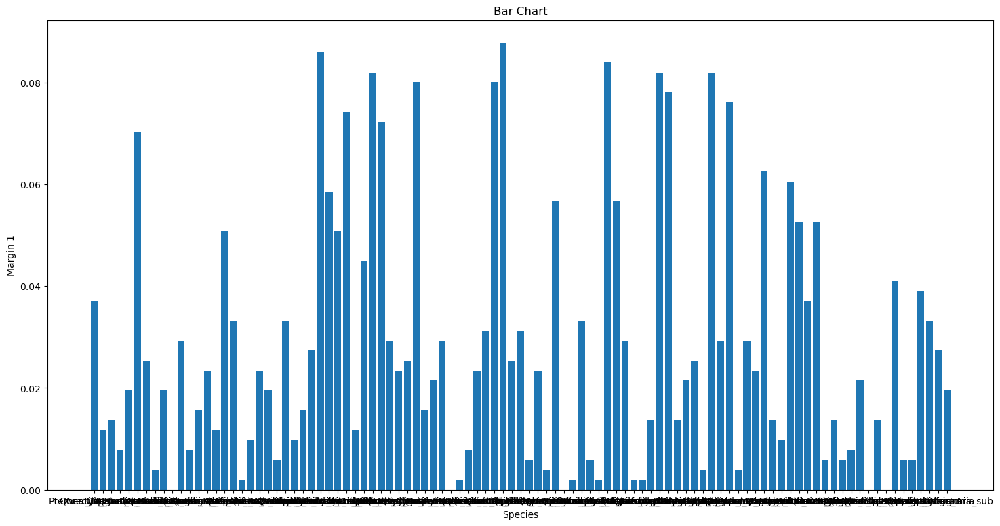

In [ ]:
plt.figure(figsize=(18,9))
# Bar chart with day against tip
plt.bar(train_data['species'], train_data['margin1'])

plt.title("Bar Chart")

# Setting the X and Y labels
plt.xlabel('Species')
plt.ylabel('Margin 1')

# Adding the legends
plt.show()

Display Bar Chart showing the relation between the Species and Shape 1

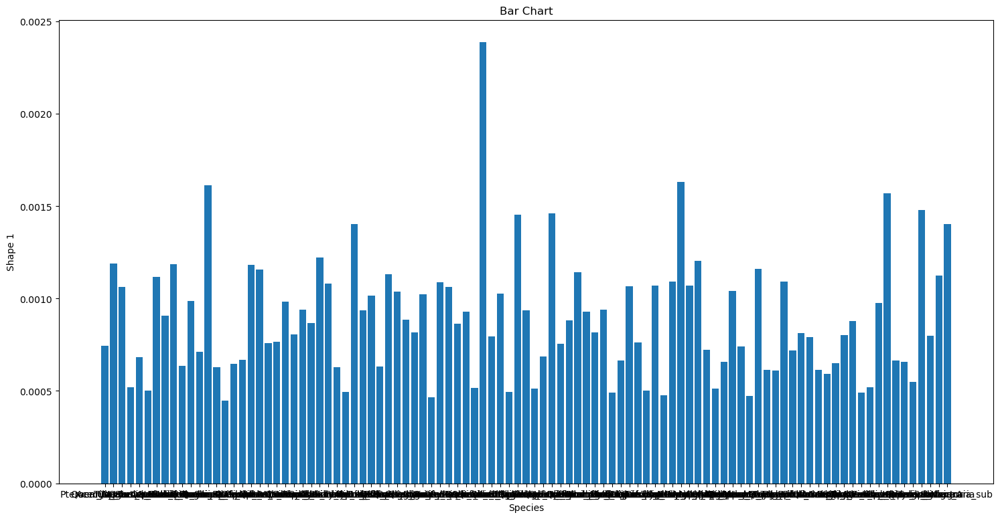

In [ ]:
plt.figure(figsize=(18,9))
# Bar chart with day against tip
plt.bar(train_data['species'], train_data['shape1'])

plt.title("Bar Chart")

# Setting the X and Y labels
plt.xlabel('Species')
plt.ylabel('Shape 1')

# Adding the legends
plt.show()

Display Bar Chart showing the relation between the Species and Texture 1

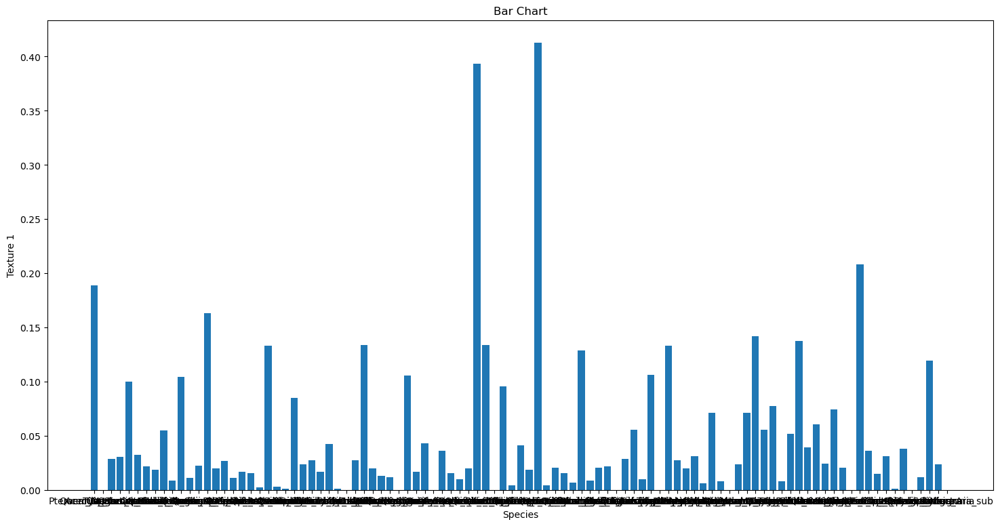

In [ ]:
plt.figure(figsize=(18,9))
# Bar chart with day against tip
plt.bar(train_data['species'], train_data['texture1'])

plt.title("Bar Chart")

# Setting the X and Y labels
plt.xlabel('Species')
plt.ylabel('Texture 1')

# Adding the legends
plt.show()

Display the distribution of margin 1 in our dataset

<AxesSubplot:xlabel='margin1'>

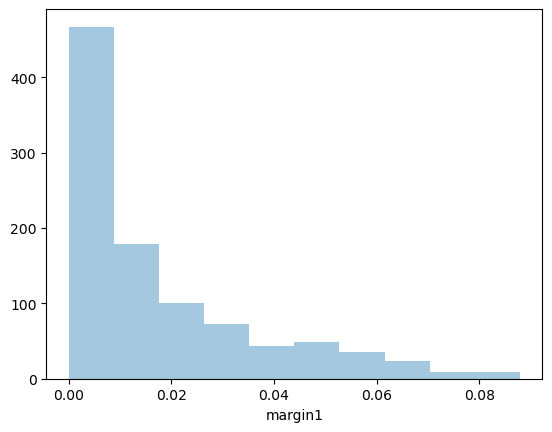

In [ ]:
sns.distplot(train_data['margin1'], bins=10, kde=False)

Display the distribution of species

<AxesSubplot:>

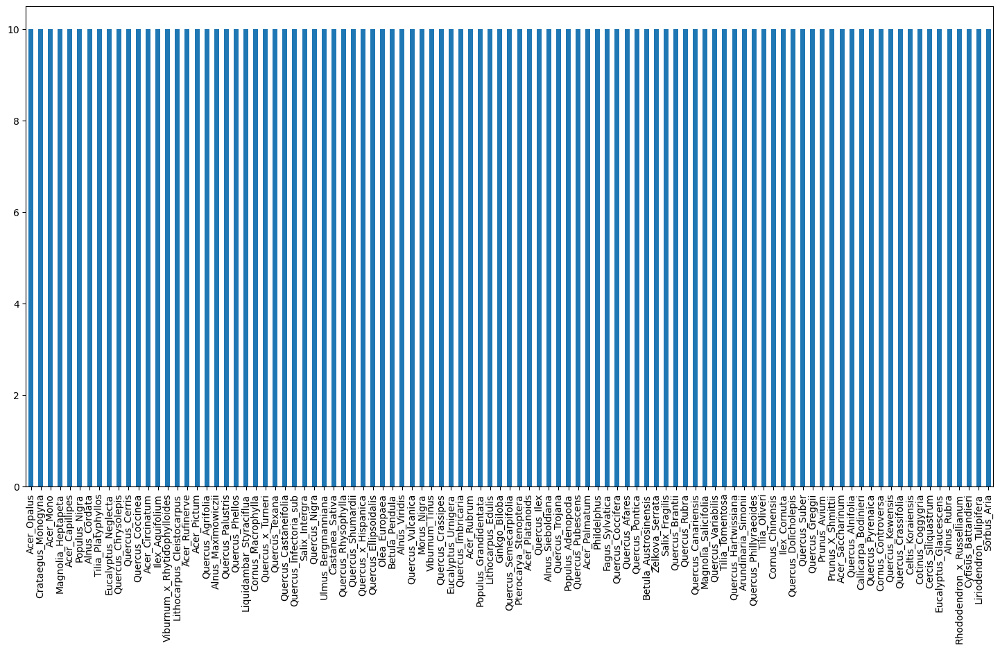

In [ ]:
plt.figure(figsize=(18,9))
train_data['species'].value_counts().plot(kind='bar')

#### Visualize the first 25 images

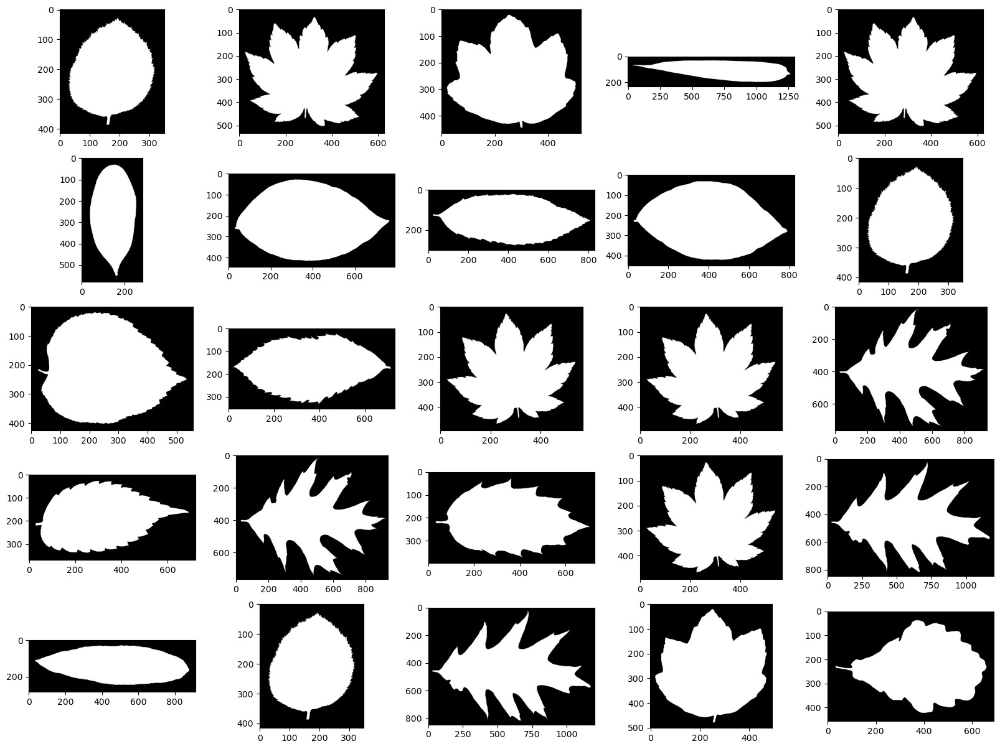

In [ ]:
plt.figure(figsize=(20,15))
from tensorflow.keras.utils import load_img
for i in range(25):
    j=np.random.choice((os.listdir('images')))
    plt.subplot(5,5,i+1)
    img=load_img(os.path.join('images',j))
    plt.imshow(img)

### Correlation Matrix

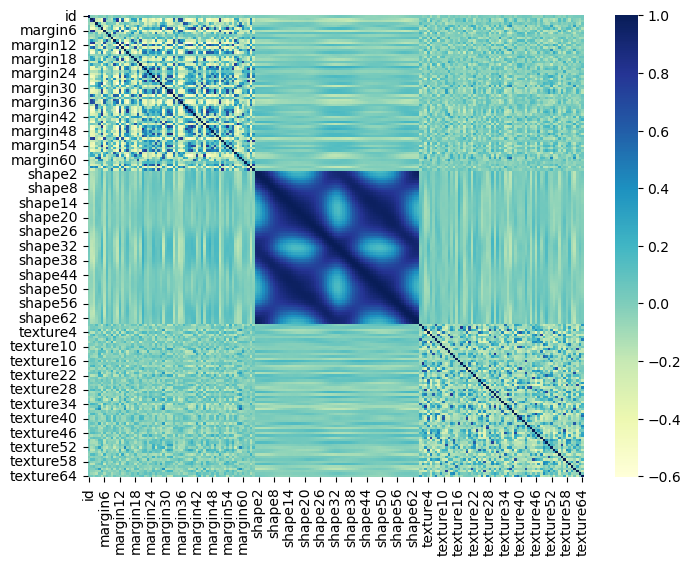

In [ ]:
plt.figure(figsize=(8, 6))

# plotting correlation heatmap
dataplot = sns.heatmap(train_data.corr(), cmap="YlGnBu")

# displaying heatmap
plt.show()

The values of correlations are not clear, so we'll use another approach

In [ ]:
train_data.corr().style.background_gradient(cmap="YlGnBu")

### Label Encoding

In [ ]:
# load the label encoder
label_encoder = preprocessing.LabelEncoder()

# Encode labels in column 'species'
train_data['species']= label_encoder.fit_transform(train_data['species'])

train_data['species'].unique()

array([ 3, 49, 65, 94, 84, 40, 54, 78, 53, 89, 98, 16, 74, 50, 58, 31, 43,
        4, 75, 44, 83, 13, 66, 15,  6, 73, 22, 36, 27, 88, 12, 28, 21, 25,
       20, 60, 69, 23, 76, 18, 52,  9, 48, 47, 64, 81, 62, 34, 92, 79, 82,
       32, 35, 72, 71, 11, 51,  5,  8, 37, 97, 33,  1, 59, 56, 57, 29, 93,
       10, 46,  0, 39,  2, 24, 26, 87, 55, 38, 45,  7, 67, 30, 61, 96, 41,
       85, 14, 17, 42, 63, 86, 80, 77, 19, 95, 70, 90, 68, 91])

### Split data into train and validation set

In [ ]:
 X_train, X_valid, y_train, y_valid = train_test_split( train_data.drop(columns=["species","id"]),
                                                        train_data['species'],
                                                        stratify=train_data['species'],
                                                        test_size=0.2,
                                                        random_state=42)

In [ ]:
X_train

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,shape11,shape12,shape13,shape14,shape15,shape16,shape17,shape18,shape19,shape20,shape21,shape22,shape23,shape24,shape25,shape26,shape27,shape28,shape29,shape30,shape31,shape32,shape33,shape34,shape35,shape36,shape37,shape38,shape39,shape40,shape41,shape42,shape43,shape44,shape45,shape46,shape47,shape48,shape49,shape50,shape51,shape52,shape53,shape54,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
207,0.000000,0.000000,0.070312,0.136720,0.005859,0.000000,0.000000,0.000000,0.001953,0.000000,0.000000,0.003906,0.001953,0.048828,0.003906,0.000000,0.001953,0.023438,0.025391,0.005859,0.007812,0.000000,0.000000,0.000000,0.027344,0.011719,0.005859,0.044922,0.060547,0.001953,0.001953,0.001953,0.001953,0.000000,0.000000,0.003906,0.011719,0.037109,0.003906,0.001953,0.005859,0.025391,0.003906,0.007812,0.027344,0.003906,0.037109,0.000000,0.017578,0.000000,0.000000,0.001953,0.000000,0.029297,0.000000,0.001953,0.000000,0.017578,0.220700,0.025391,0.007812,0.001953,0.005859,0.003906,0.000469,0.000451,0.000420,0.000380,0.000368,0.000359,0.000326,0.000298,0.000298,0.000301,0.000270,0.000232,0.000249,0.000276,0.000235,0.000226,0.000264,0.000262,0.000259,0.000300,0.000321,0.000315,0.000360,0.000358,0.000402,0.000427,0.000477,0.000502,0.000549,0.000583,0.000626,0.000642,0.000597,0.000557,0.000529,0.000480,0.000460,0.000436,0.000397,0.000354,0.000335,0.000283,0.000278,0.000263,0.000227,0.000250,0.000231,0.000206,0.000248,0.000224,0.000221,0.000269,0.000271,0.000276,0.000319,0.000343,0.000361,0.000396,0.000420,0.000446,0.000471,0.000482,0.000476,0.000468,0.000000,0.007812,0.030273,0.000977,0.054688,0.000977,0.003906,0.042969,0.012695,0.000000,0.012695,0.011719,0.007812,0.050781,0.000000,0.000000,0.006836,0.001953,0.001953,0.018555,0.000000,0.023438,0.018555,0.000000,0.004883,0.000000,0.001953,0.022461,0.042969,0.040039,0.066406,0.017578,0.000977,0.001953,0.039062,0.000000,0.000000,0.011719,0.000000,0.000000,0.000000,0.004883,0.000000,0.000000,0.009766,0.044922,0.028320,0.066406,0.028320,0.059570,0.000000,0.117190,0.001953,0.018555,0.038086,0.000000,0.002930,0.000000,0.017578,0.000000,0.000000,0.000977,0.000977,0.000977
252,0.003906,0.001953,0.058594,0.048828,0.005859,0.017578,0.000000,0.000000,0.048828,0.000000,0.005859,0.003906,0.035156,0.021484,0.009766,0.000000,0.005859,0.015625,0.013672,0.009766,0.035156,0.005859,0.000000,0.000000,0.013672,0.011719,0.005859,0.031250,0.046875,0.007812,0.005859,0.001953,0.007812,0.000000,0.009766,0.005859,0.025391,0.060547,0.007812,0.000000,0.007812,0.037109,0.003906,0.003906,0.042969,0.001953,0.046875,0.009766,0.007812,0.015625,0.031250,0.000000,0.001953,0.003906,0.000000,0.005859,0.007812,0.037109,0.056641,0.027344,0.001953,0.007812,0.04

### Data Normalization

In [ ]:
# define standard scaler
stdscaler = StandardScaler()

# normlize integer columns
X_train = stdscaler.fit_transform(X_train)
X_valid = stdscaler.transform(X_valid)

In [ ]:
X_train

array([[-0.88161677, -0.73427168,  1.51318332, ..., -0.49678246,
        -0.58676919, -0.81664014],
       [-0.68043605, -0.68417638,  1.05432684, ..., -0.52201872,
         0.19537902, -0.85946203],
       [ 0.12433832,  0.06730437, -1.16363613, ..., -0.34544242,
        -0.65790667, -0.64544026],
       ...,
       [-0.88161677, -0.73427168, -0.01641661, ...,  0.23473314,
        -0.44456705, -0.3030405 ],
       [-0.88161677, -0.73427168,  1.51318332, ..., -0.06797277,
        -0.37350238, -0.17461867],
       [ 0.02374797, -0.58398579, -1.16363613, ..., -0.52201872,
        -0.65790667, -0.26021861]])

In [ ]:
X_valid

array([[ 0.32557055, -0.53389049, -0.16936877, ..., -0.52201872,
        -0.65790667, -0.51706227],
       [ 2.03570965,  1.62036118, -0.93420789, ..., -0.47157204,
        -0.65790667, -0.26021861],
       [ 0.12433832, -0.48376954,  0.44247904, ...,  0.41130943,
        -0.65790667, -0.85946203],
       ...,
       [ 0.02374797, -0.18319776,  1.8191268 , ..., -0.26975949,
        -0.65790667,  2.26513303],
       [-0.78102641, -0.63408108, -0.55178833, ..., -0.34544242,
        -0.65790667,  0.42462474],
       [-0.88161677, -0.73427168,  1.13080292, ..., -0.42112536,
        -0.08909809, -0.77386209]])

In [ ]:
# display the total number of column features
X_train.shape[1]

192

In [ ]:
!pip install --upgrade talos

# Part II: Training a neural network


The build_model function constructs our model with the chosen parameters other than the default
it takes the training data, training labels, validation data and validation labels as input parameters
and outputs the history and the trained model, also the model parameters are saved as a file using the ModelCheckpoint built-in function

In [ ]:
def build_model(X_train, y_train, X_valid, y_valid, params):
    model = tf.keras.Sequential([
    tf.keras.Input(shape = (X_train.shape[1],) ),
    tf.keras.layers.Dense(params["hidden_layer"], activation='tanh'),
    tf.keras.layers.Dropout(params["dropout"]),
    tf.keras.layers.Dense(number_of_classes, activation='softmax')])

    model.compile(loss='SparseCategoricalCrossentropy', optimizer=params["optimizer"], metrics=['accuracy'])

    EarlyStop = tf.keras.callbacks.EarlyStopping(patience = 10)
    checkpoint_conv = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

    output = model.fit(X_train, y_train, batch_size = params["batch_size"] ,epochs = 1000, verbose = True,
                        validation_data = (X_valid, y_valid), callbacks=[EarlyStop,checkpoint_conv])
    return output, model

The evaluate_model_params takes the model hyperparameters as input parameters and are all set to a default value which will be set if it was not inputed on calling the function

In [ ]:
def evaluate_model_params(batch_size = 16, hidden_layer = 384, optimizer = "Adam", dropout = 0.5,
                        learning_rate = 0.001, regularization = 0.001):

    if optimizer == "Adam":
        opt = tf.keras.optimizers.Adam(learning_rate = learning_rate, decay = regularization)
    elif optimizer == "SGD":
        opt = tf.keras.optimizers.SGD(learning_rate = learning_rate, decay = regularization)
    elif optimizer == "RMSprop":
        opt = tf.keras.optimizers.RMSprop(learning_rate = learning_rate, decay = regularization)
    else:
        print("Invalid Optimizer Name")
        return

    params = {
      "optimizer" : opt,
      "batch_size": batch_size,
      "dropout": 0.5,
      "hidden_layer": 384
     }

    history, model = build_model(X_train, y_train, X_valid, y_valid, params)

    fig, axes = plt.subplots(2,1, figsize = [16, 16])
    axes[0].plot(history.history['accuracy'])
    try:
        axes[0].plot(history.history['val_accuracy'])
        axes[0].legend(['Train', 'Validation'])
    except:
        pass
    axes[0].set_title('{:s}'.format('accuracy'))
    axes[0].set_ylabel('{:s}'.format('accuracy'))
    axes[0].set_xlabel('Epoch')
    fig.subplots_adjust(hspace=0.5)
    axes[1].plot(history.history['loss'])
    try:
        axes[1].plot(history.history['val_loss'])
        axes[1].legend(['Train', 'Validation'])
    except:
        pass
    axes[1].set_title('Model Loss')
    axes[1].set_ylabel('Loss')
    axes[1].set_xlabel('Epoch')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')

evaluate the model with the default hyperparameters as follows:
batch_size = 16, hidden_layer = 384, optimizer = "Adam", dropout = 0.5

Also plot the number of epochs against the accuracy for both the training and validation sets,
as well as the number of epochs against the loss for both the training and validation sets

Epoch 1/1000
34/50 [===================>..........] - ETA: 0s - loss: 4.0981 - accuracy: 0.1103     
Epoch 1: val_accuracy improved from -inf to 0.81818, saving model to model1.hdf5
50/50 [==============================] - 1s 5ms/step - loss: 3.6669 - accuracy: 0.2045 - val_loss: 1.9528 - val_accuracy: 0.8182
Epoch 2/1000
35/50 [====================>.........] - ETA: 0s - loss: 1.6972 - accuracy: 0.6982
Epoch 2: val_accuracy improved from 0.81818 to 0.95455, saving model to model1.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 1.5634 - accuracy: 0.7285 - val_loss: 0.8958 - val_accuracy: 0.9545
Epoch 3/1000
34/50 [===================>..........] - ETA: 0s - loss: 0.7936 - accuracy: 0.9044
Epoch 3: val_accuracy improved from 0.95455 to 0.97475, saving model to model1.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 0.7601 - accuracy: 0.8977 - val_loss: 0.5124 - val_accuracy: 0.9747
Epoch 4/1000
35/50 [====================>.........] - ETA: 0s - loss: 0

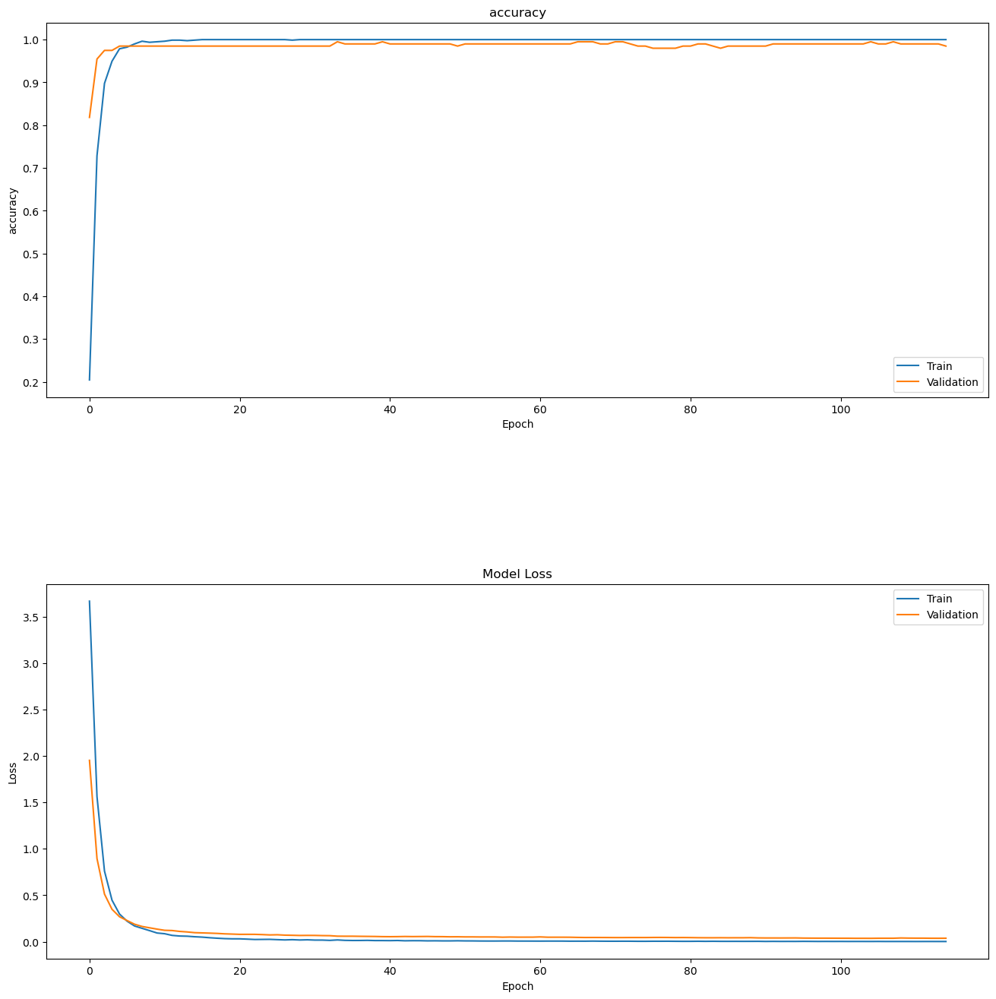

In [ ]:
filepath = 'model1.hdf5'
evaluate_model_params()

### Explore different hyperparameters other than the default

Epoch 1/1000
20/27 [=====================>........] - ETA: 0s - loss: 4.2008 - accuracy: 0.0933    
Epoch 1: val_accuracy improved from -inf to 0.64141, saving model to model2.hdf5
27/27 [==============================] - 0s 8ms/step - loss: 3.9393 - accuracy: 0.1351 - val_loss: 2.4238 - val_accuracy: 0.6414
Epoch 2/1000
24/27 [=========================>....] - ETA: 0s - loss: 1.9995 - accuracy: 0.6319
Epoch 2: val_accuracy improved from 0.64141 to 0.92929, saving model to model2.hdf5
27/27 [==============================] - 0s 4ms/step - loss: 1.9580 - accuracy: 0.6427 - val_loss: 1.2872 - val_accuracy: 0.9293
Epoch 3/1000
23/27 [========================>.....] - ETA: 0s - loss: 1.0998 - accuracy: 0.8435
Epoch 3: val_accuracy improved from 0.92929 to 0.94444, saving model to model2.hdf5
27/27 [==============================] - 0s 4ms/step - loss: 1.0789 - accuracy: 0.8447 - val_loss: 0.7886 - val_accuracy: 0.9444
Epoch 4/1000
26/27 [===========================>..] - ETA: 0s - loss: 0.

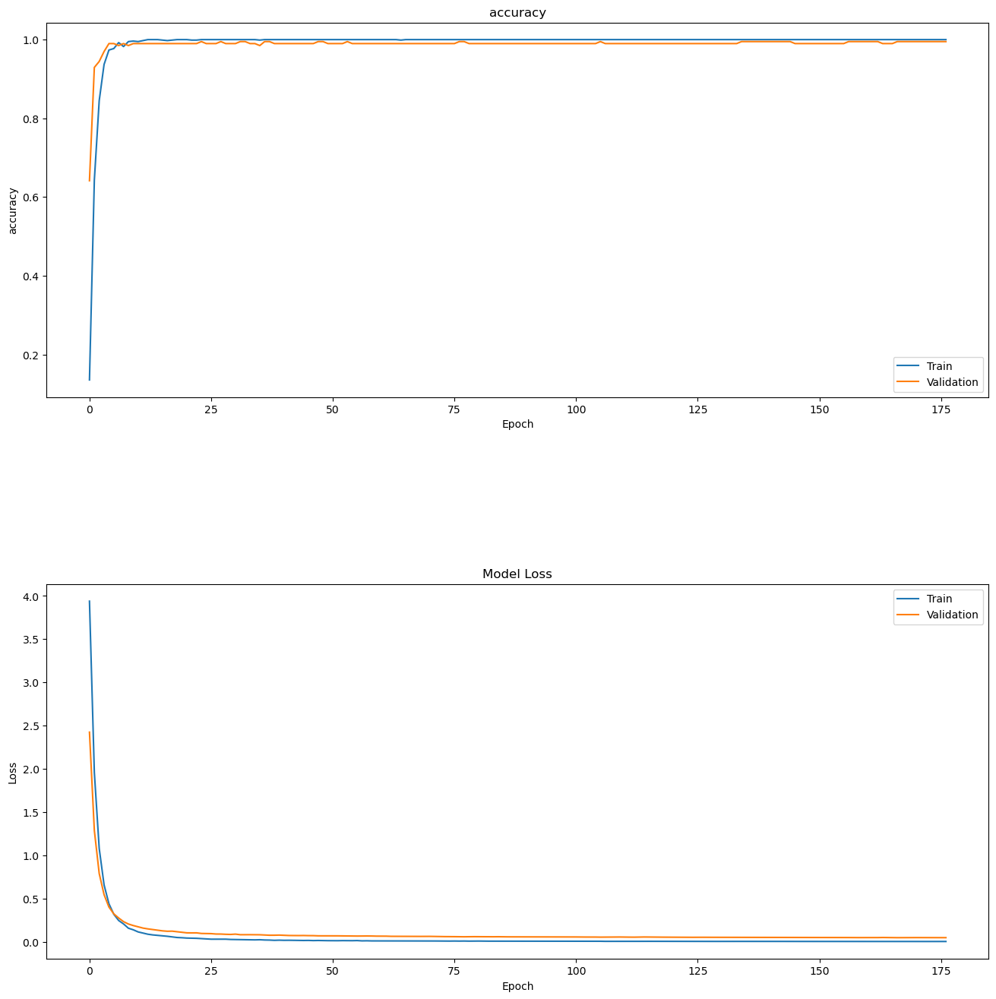

In [ ]:
filepath = 'model2.hdf5'
evaluate_model_params(batch_size = 30)

Epoch 1/1000
20/20 [==============================] - ETA: 0s - loss: 4.1951 - accuracy: 0.1061    
Epoch 1: val_accuracy improved from -inf to 0.51010, saving model to model3.hdf5
20/20 [==============================] - 0s 11ms/step - loss: 4.1951 - accuracy: 0.1061 - val_loss: 2.7756 - val_accuracy: 0.5101
Epoch 2/1000
 1/20 [>.............................] - ETA: 0s - loss: 2.8458 - accuracy: 0.4250
Epoch 2: val_accuracy improved from 0.51010 to 0.90404, saving model to model3.hdf5
20/20 [==============================] - 0s 4ms/step - loss: 2.2450 - accuracy: 0.5442 - val_loss: 1.5619 - val_accuracy: 0.9040
Epoch 3/1000
 1/20 [>.............................] - ETA: 0s - loss: 1.6204 - accuracy: 0.7750
Epoch 3: val_accuracy improved from 0.90404 to 0.94444, saving model to model3.hdf5
20/20 [==============================] - 0s 4ms/step - loss: 1.3189 - accuracy: 0.8182 - val_loss: 0.9471 - val_accuracy: 0.9444
Epoch 4/1000
 1/20 [>.............................] - ETA: 0s - loss: 0

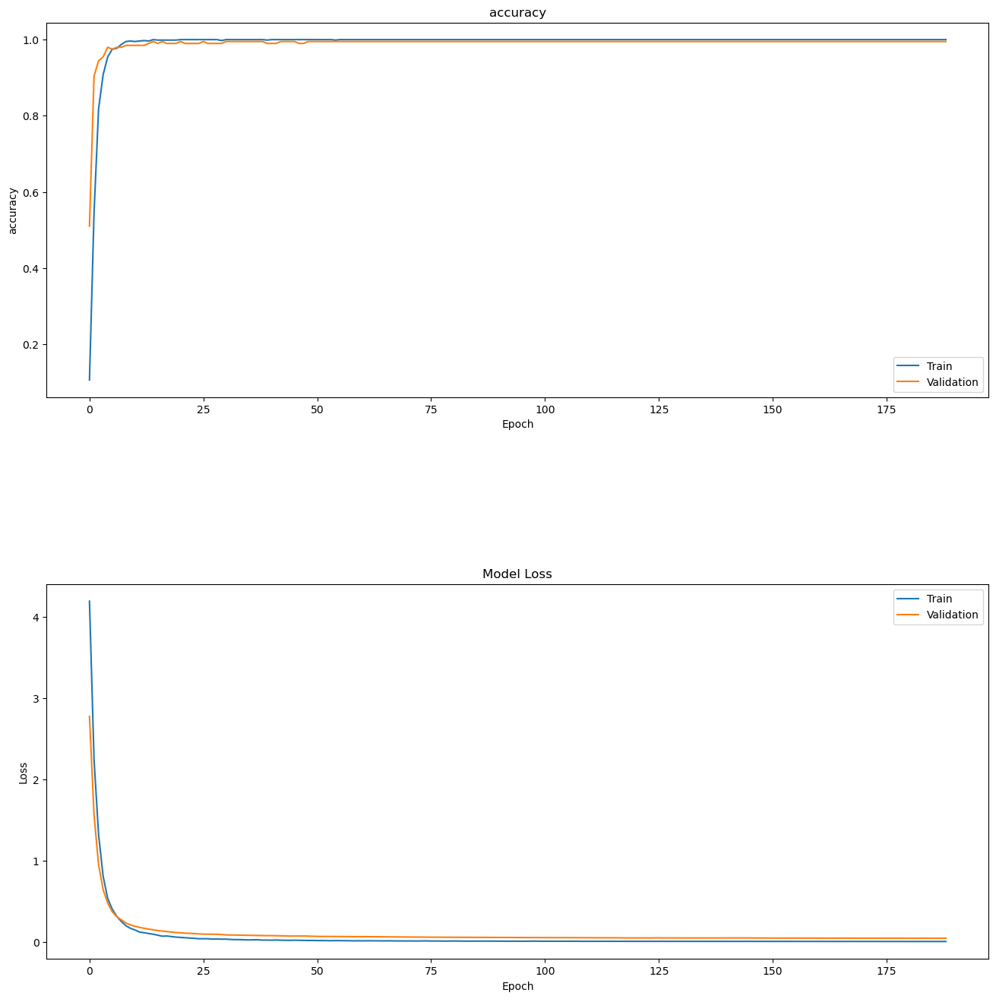

In [ ]:
filepath = 'model3.hdf5'
evaluate_model_params(batch_size = 40)

Epoch 1/1000
32/50 [==================>...........] - ETA: 0s - loss: 4.1230 - accuracy: 0.1348     
Epoch 1: val_accuracy improved from -inf to 0.81313, saving model to model3.hdf5
50/50 [==============================] - 0s 5ms/step - loss: 3.6814 - accuracy: 0.2109 - val_loss: 1.9375 - val_accuracy: 0.8131
Epoch 2/1000
27/50 [===============>..............] - ETA: 0s - loss: 1.7254 - accuracy: 0.6944
Epoch 2: val_accuracy improved from 0.81313 to 0.94949, saving model to model3.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 1.5315 - accuracy: 0.7449 - val_loss: 0.9035 - val_accuracy: 0.9495
Epoch 3/1000
32/50 [==================>...........] - ETA: 0s - loss: 0.7964 - accuracy: 0.9102
Epoch 3: val_accuracy improved from 0.94949 to 0.98485, saving model to model3.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 0.7378 - accuracy: 0.9154 - val_loss: 0.5200 - val_accuracy: 0.9848
Epoch 4/1000
33/50 [==================>...........] - ETA: 0s - loss: 0

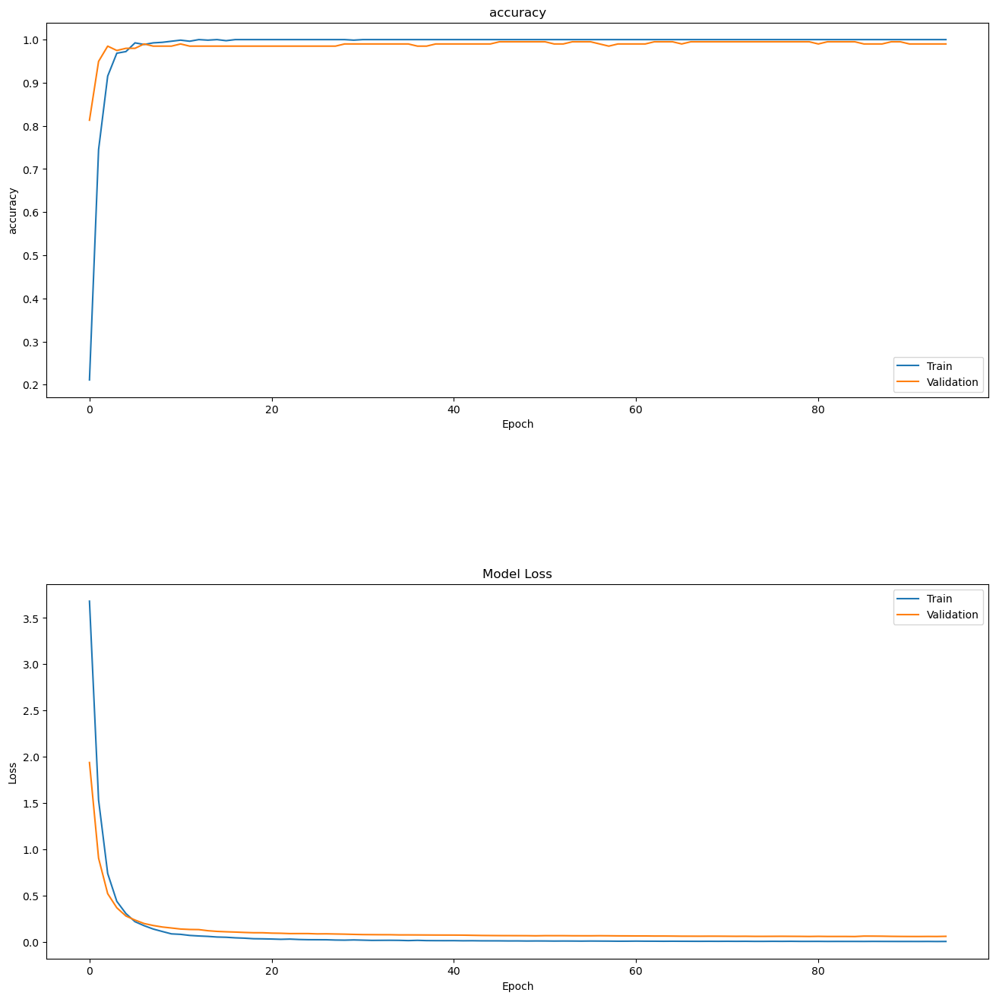

In [ ]:
evaluate_model_params(dropout = 0)

Epoch 1/1000
32/50 [==================>...........] - ETA: 0s - loss: 4.1220 - accuracy: 0.1270     
Epoch 1: val_accuracy improved from -inf to 0.82323, saving model to model3.hdf5
50/50 [==============================] - 0s 5ms/step - loss: 3.6452 - accuracy: 0.2134 - val_loss: 1.9178 - val_accuracy: 0.8232
Epoch 2/1000
29/50 [================>.............] - ETA: 0s - loss: 1.6769 - accuracy: 0.7134
Epoch 2: val_accuracy improved from 0.82323 to 0.95960, saving model to model3.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 1.5166 - accuracy: 0.7525 - val_loss: 0.8818 - val_accuracy: 0.9596
Epoch 3/1000
32/50 [==================>...........] - ETA: 0s - loss: 0.7842 - accuracy: 0.8984
Epoch 3: val_accuracy improved from 0.95960 to 0.98485, saving model to model3.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 0.7425 - accuracy: 0.9053 - val_loss: 0.5177 - val_accuracy: 0.9848
Epoch 4/1000
28/50 [===============>..............] - ETA: 0s - loss: 0

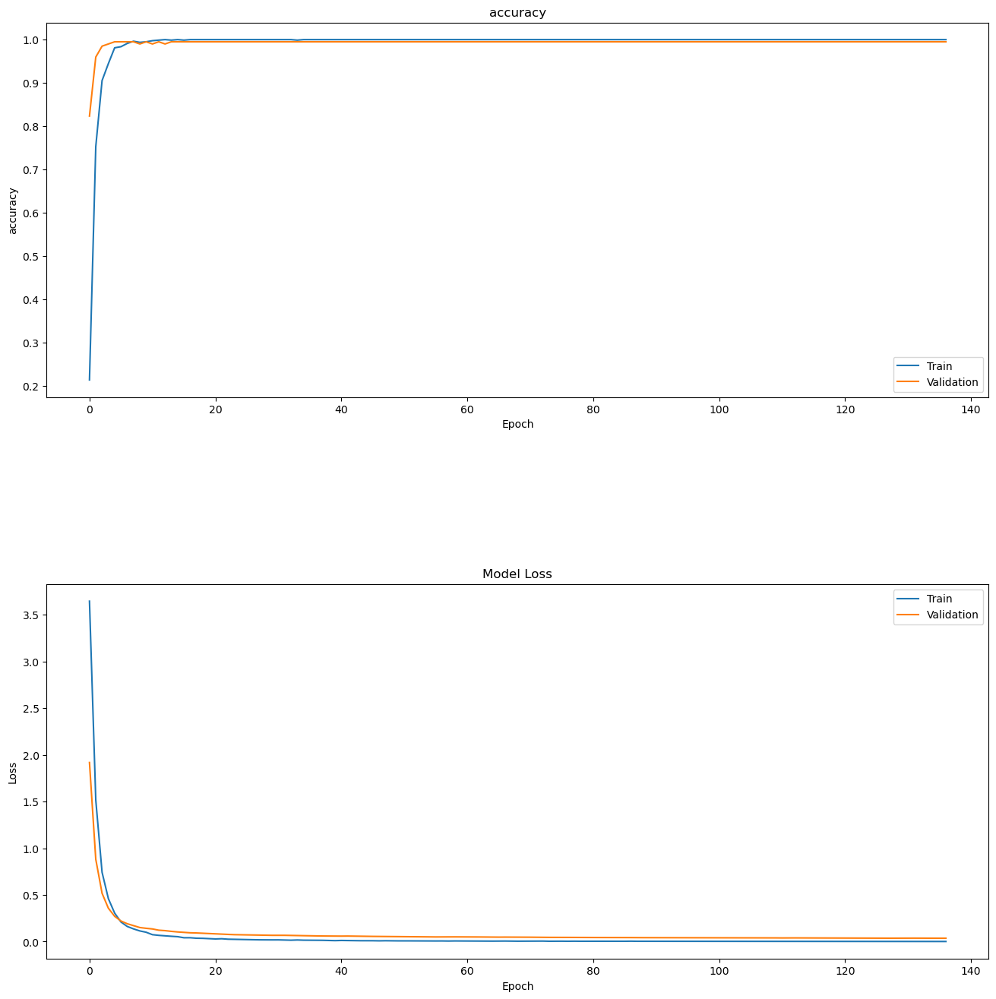

In [ ]:
evaluate_model_params(dropout = 0.2)

Epoch 1/1000
27/50 [===============>..............] - ETA: 0s - loss: 5.0108 - accuracy: 0.0093     
Epoch 1: val_accuracy improved from -inf to 0.00505, saving model to model4.hdf5
50/50 [==============================] - 0s 5ms/step - loss: 5.0414 - accuracy: 0.0051 - val_loss: 4.7338 - val_accuracy: 0.0051
Epoch 2/1000
33/50 [==================>...........] - ETA: 0s - loss: 4.9605 - accuracy: 0.0095    
Epoch 2: val_accuracy improved from 0.00505 to 0.01010, saving model to model4.hdf5
50/50 [==============================] - 0s 2ms/step - loss: 4.9739 - accuracy: 0.0126 - val_loss: 4.6420 - val_accuracy: 0.0101
Epoch 3/1000
27/50 [===============>..............] - ETA: 0s - loss: 4.8515 - accuracy: 0.0162    
Epoch 3: val_accuracy improved from 0.01010 to 0.02020, saving model to model4.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 4.8342 - accuracy: 0.0177 - val_loss: 4.5562 - val_accuracy: 0.0202
Epoch 4/1000
36/50 [====================>.........] - ETA: 0s -

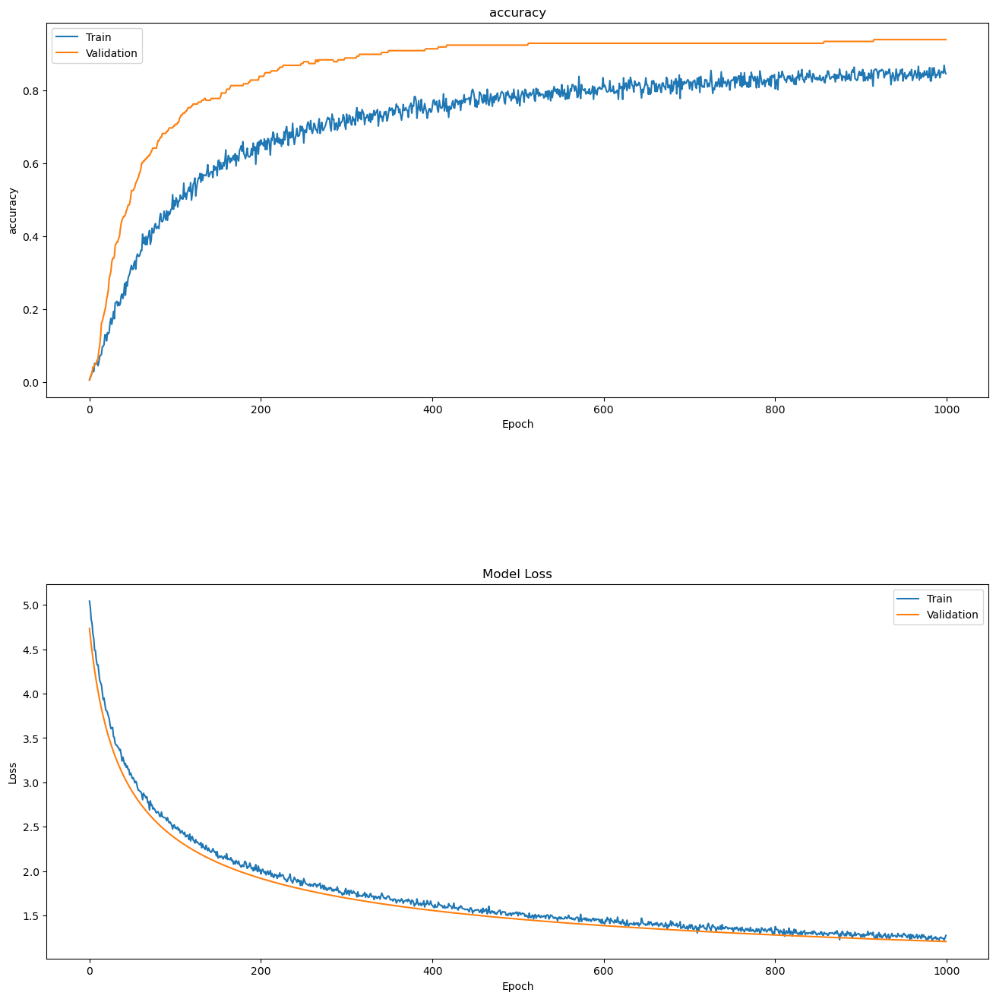

In [ ]:
filepath = 'model4.hdf5'
evaluate_model_params(optimizer = "SGD")

Epoch 1/1000
47/50 [===========================>..] - ETA: 0s - loss: 3.5838 - accuracy: 0.2168   
Epoch 1: val_accuracy improved from -inf to 0.79798, saving model to model5.hdf5
50/50 [==============================] - 1s 5ms/step - loss: 3.5374 - accuracy: 0.2260 - val_loss: 2.0319 - val_accuracy: 0.7980
Epoch 2/1000
26/50 [==============>...............] - ETA: 0s - loss: 1.8703 - accuracy: 0.6971
Epoch 2: val_accuracy improved from 0.79798 to 0.90909, saving model to model5.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 1.6967 - accuracy: 0.7311 - val_loss: 1.0977 - val_accuracy: 0.9091
Epoch 3/1000
29/50 [================>.............] - ETA: 0s - loss: 1.0050 - accuracy: 0.8750
Epoch 3: val_accuracy improved from 0.90909 to 0.97980, saving model to model5.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 0.9318 - accuracy: 0.8851 - val_loss: 0.6468 - val_accuracy: 0.9798
Epoch 4/1000
29/50 [================>.............] - ETA: 0s - loss: 0.5

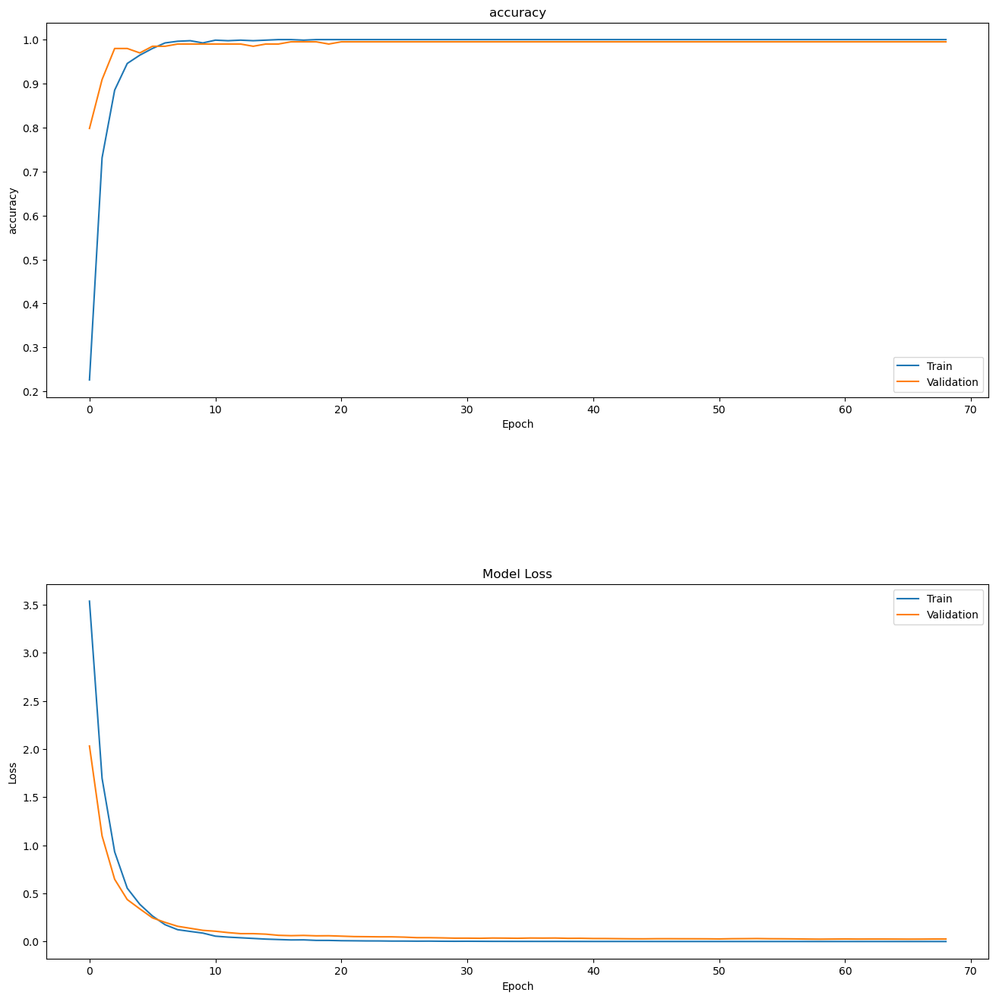

In [ ]:
filepath = 'model5.hdf5'
evaluate_model_params(optimizer = "RMSprop")

Epoch 1/1000
26/50 [==============>...............] - ETA: 0s - loss: 4.3010 - accuracy: 0.1082 
Epoch 1: val_accuracy improved from -inf to 0.77778, saving model to model6.hdf5
50/50 [==============================] - 0s 5ms/step - loss: 3.7134 - accuracy: 0.1894 - val_loss: 2.0102 - val_accuracy: 0.7778
Epoch 2/1000
31/50 [=================>............] - ETA: 0s - loss: 1.7217 - accuracy: 0.6895
Epoch 2: val_accuracy improved from 0.77778 to 0.92929, saving model to model6.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 1.5560 - accuracy: 0.7298 - val_loss: 0.9265 - val_accuracy: 0.9293
Epoch 3/1000
32/50 [==================>...........] - ETA: 0s - loss: 0.7991 - accuracy: 0.9141
Epoch 3: val_accuracy improved from 0.92929 to 0.95960, saving model to model6.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 0.7593 - accuracy: 0.9141 - val_loss: 0.5527 - val_accuracy: 0.9596
Epoch 4/1000
38/50 [=====================>........] - ETA: 0s - loss: 0.487

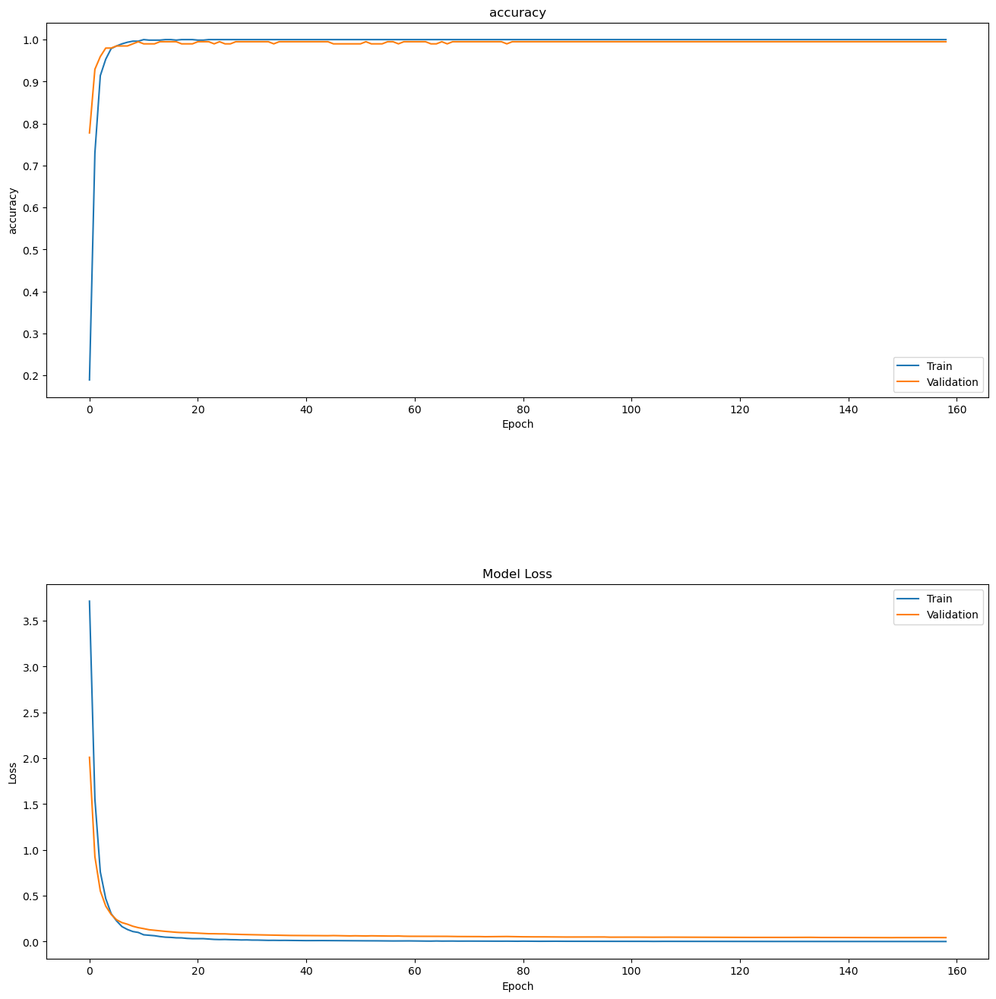

In [ ]:
filepath = 'model6.hdf5'
evaluate_model_params(hidden_layer = 256)

Epoch 1/1000
32/50 [==================>...........] - ETA: 0s - loss: 4.0228 - accuracy: 0.1543     
Epoch 1: val_accuracy improved from -inf to 0.81313, saving model to model7.hdf5
50/50 [==============================] - 0s 5ms/step - loss: 3.5722 - accuracy: 0.2311 - val_loss: 1.8843 - val_accuracy: 0.8131
Epoch 2/1000
31/50 [=================>............] - ETA: 0s - loss: 1.5916 - accuracy: 0.7339
Epoch 2: val_accuracy improved from 0.81313 to 0.93434, saving model to model7.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 1.4648 - accuracy: 0.7563 - val_loss: 0.8882 - val_accuracy: 0.9343
Epoch 3/1000
31/50 [=================>............] - ETA: 0s - loss: 0.7538 - accuracy: 0.9274
Epoch 3: val_accuracy improved from 0.93434 to 0.94949, saving model to model7.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 0.7416 - accuracy: 0.9141 - val_loss: 0.5319 - val_accuracy: 0.9495
Epoch 4/1000
30/50 [=================>............] - ETA: 0s - loss: 0

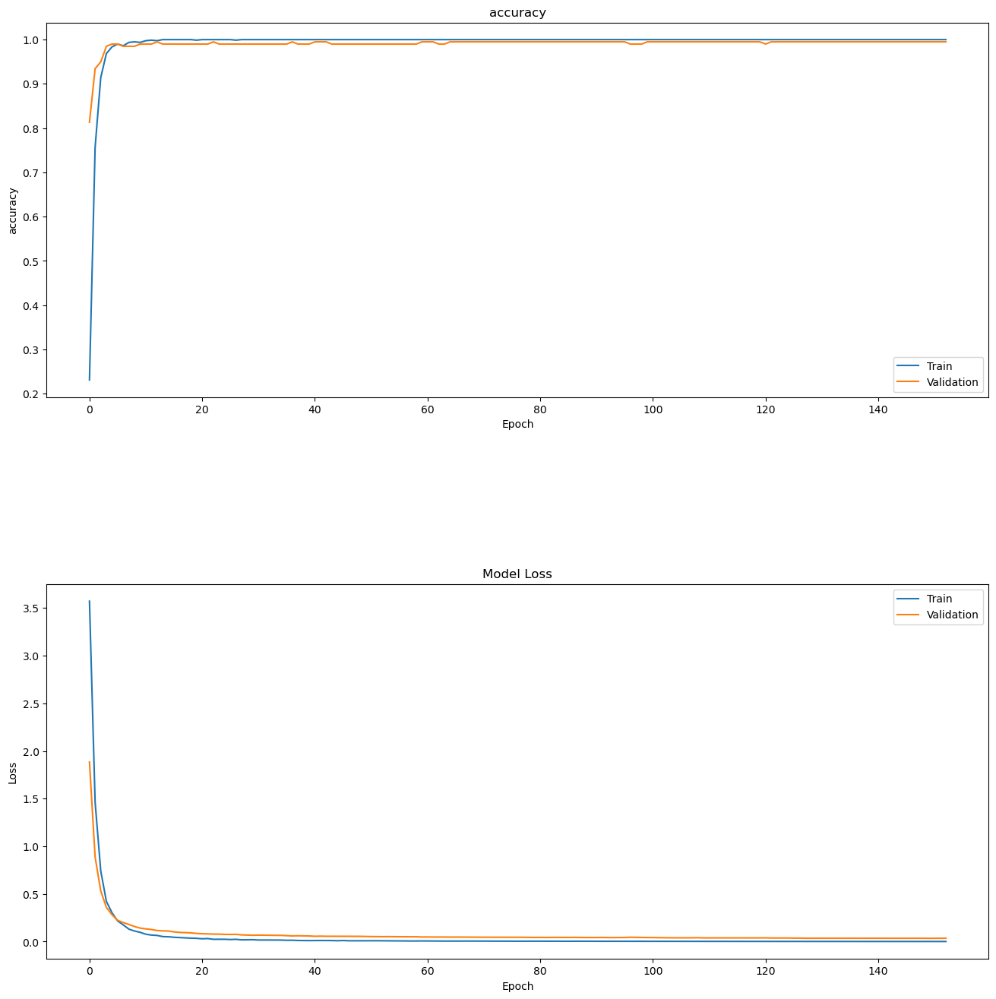

In [ ]:
filepath = 'model7.hdf5'
evaluate_model_params(hidden_layer = 180)

### Trivial Approach

choose the batch size with the best accuracy compared to other choices of batch sizes and apply the same strategy for the dropout, optimizer and number of nodes in tanh hidden layer

Epoch 1/1000
19/27 [====================>.........] - ETA: 0s - loss: 3.9143 - accuracy: 0.1439    
Epoch 1: val_accuracy improved from -inf to 0.75253, saving model to model7.hdf5
27/27 [==============================] - 1s 9ms/step - loss: 3.6652 - accuracy: 0.1970 - val_loss: 2.2269 - val_accuracy: 0.7525
Epoch 2/1000
25/27 [==========================>...] - ETA: 0s - loss: 1.9279 - accuracy: 0.6560
Epoch 2: val_accuracy improved from 0.75253 to 0.90909, saving model to model7.hdf5
27/27 [==============================] - 0s 4ms/step - loss: 1.9124 - accuracy: 0.6591 - val_loss: 1.2904 - val_accuracy: 0.9091
Epoch 3/1000
24/27 [=========================>....] - ETA: 0s - loss: 1.1617 - accuracy: 0.8389
Epoch 3: val_accuracy improved from 0.90909 to 0.94444, saving model to model7.hdf5
27/27 [==============================] - 0s 4ms/step - loss: 1.1482 - accuracy: 0.8384 - val_loss: 0.8113 - val_accuracy: 0.9444
Epoch 4/1000
24/27 [=========================>....] - ETA: 0s - loss: 0.

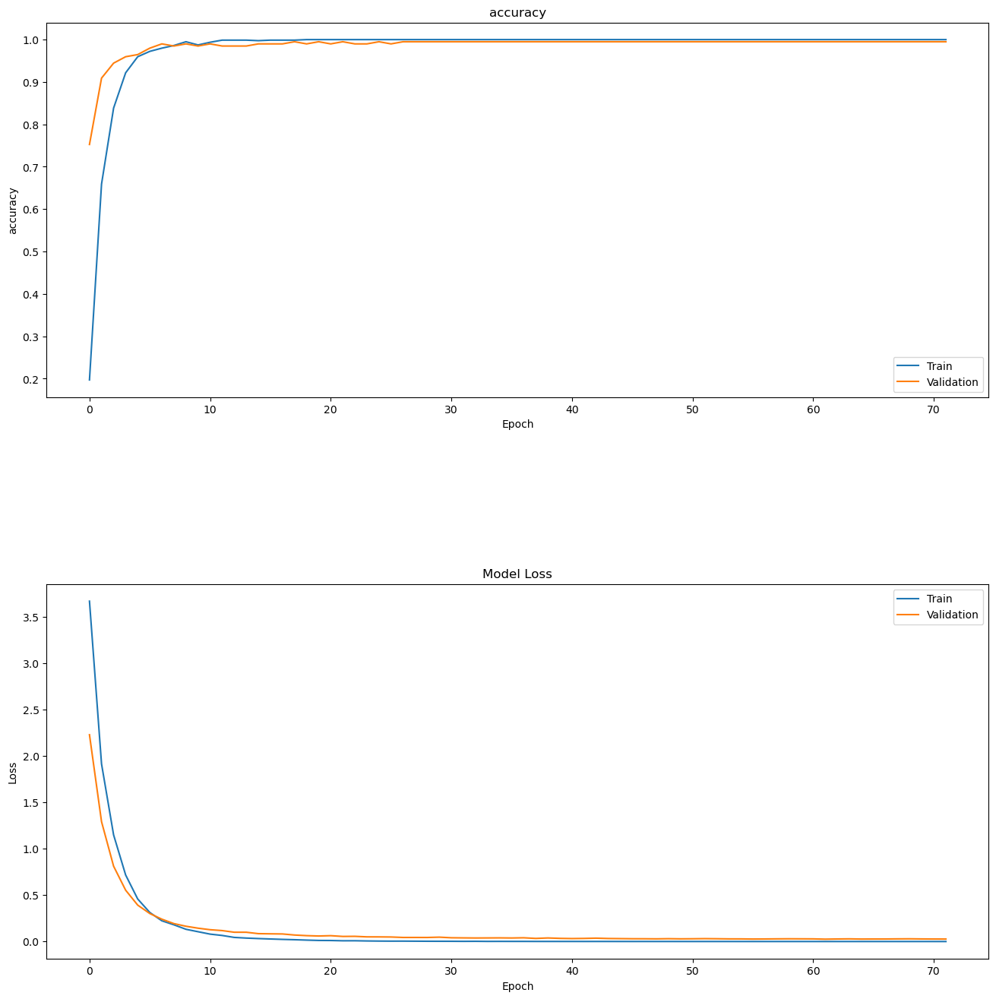

In [ ]:
evaluate_model_params(hidden_layer = 180, optimizer = "RMSprop", dropout = 0.2, batch_size = 30)

### Another approach

Obtain the best combination of hyperparameters to get the best model using talos library which is equivalent to the grid search

In [ ]:
number_of_combinations = 20

# Different Combinations of hyperparameters
p = {
    "hidden_layer" : [384, 256, 180],
    "dropout" : [0, 0.2, 0.5],
    "optimizer" : ["SGD", "adam", "rmsprop"],
    "batch_size" : [16, 30, 40]
}
filepath = 'model8.hdf5'
checkpoint_conv = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

h = ta.Scan(X_train,
            y_train,
            params = p,
            model = build_model,
            experiment_name = "talos-scan",
            x_val = X_valid,
            y_val = y_valid,
            round_limit = number_of_combinations,
            print_params = True,
            disable_progress_bar = True)

{'hidden_layer': 256, 'dropout': 0.5, 'optimizer': 'rmsprop', 'batch_size': 16}
Epoch 1/1000
34/50 [===================>..........] - ETA: 0s - loss: 4.1141 - accuracy: 0.1195     
Epoch 1: val_accuracy improved from -inf to 0.67172, saving model to model8.hdf5
50/50 [==============================] - 1s 5ms/step - loss: 3.8386 - accuracy: 0.1641 - val_loss: 2.4687 - val_accuracy: 0.6717
Epoch 2/1000
36/50 [====================>.........] - ETA: 0s - loss: 2.2362 - accuracy: 0.5885
Epoch 2: val_accuracy improved from 0.67172 to 0.91919, saving model to model8.hdf5
50/50 [==============================] - 0s 2ms/step - loss: 2.1491 - accuracy: 0.6098 - val_loss: 1.5109 - val_accuracy: 0.9192
Epoch 3/1000
30/50 [=================>............] - ETA: 0s - loss: 1.5174 - accuracy: 0.7563
Epoch 3: val_accuracy improved from 0.91919 to 0.94949, saving model to model8.hdf5
50/50 [==============================] - 0s 3ms/step - loss: 1.3783 - accuracy: 0.7980 - val_loss: 0.9597 - val_accuracy

In [ ]:
l_model = load_model("model8.hdf5")
l_model.evaluate(X_valid,y_valid)

7/7 [==============================] - 0s 1ms/step - loss: 0.0624 - accuracy: 0.9949


[0.06244494393467903, 0.9949495196342468]